# Part 3 — _Corpus analysis_:  

## Comparative analysis of all three books and drill down into Whitehead

### Import partially cleaned book texts

In [9]:
import pickle
import pandas as pd

import nltk
from nltk.stem import WordNetLemmatizer 

In [10]:
with open("data/" + "books_df.pickle", 'rb') as to_read:
        books_df = pickle.load(to_read)
books_df        

,author,title,text,break_style,start_row_text,end_material_text,main_text
0,Hume,Enquiry Concerning Human Understanding,﻿The Project Gutenberg EBook of An Enquiry Con...,SECTION I,SECTION I,INDEX,SECTION I. OF THE DIFFERENT SPECIES OF PHILOS...
1,Whitehead,Process and Reality,Skip to main content Search UPLOAD SIGN UP | L...,CHAPTER I,CHAPTER I,Index,CHAPTER I SPECULATIVE PHILOSOPHY SECTION I ...
2,James,Pluralist Universe,﻿The Project Gutenberg EBook of A Pluralistic ...,INDEX 401,INDEX 401,INDEX TO THE LECTURES,INDEX 401^S LECTURE I THE TYPES OF PHILOSO...


In [11]:
book_titles_list = [author + "\'s\n"+ title for author, title in zip(books_df['author'].to_list(), books_df['title'].to_list() ) ]
book_titles_list

["Hume's\nEnquiry Concerning Human Understanding",
 "Whitehead's\nProcess and Reality",
 "James's\nPluralist Universe"]

In [12]:
books_df[books_df['title']=='Pluralist Universe']['main_text'].iloc[0]

' INDEX 401^S   LECTURE I  THE TYPES OF PHILOSOPHIC THINKING As these lectures are meant to be public, and so few, I have assumed all very special problems to be excluded, and some topic of general interest required. Fortunately, our age seems to be growing philosophical again--still in the ashes live the wonted fires. Oxford, long the seed-bed, for the english world, of the idealism inspired by Kant and Hegel, has recently become the nursery of a very different way of thinking. Even non-philosophers have begun to take an interest in a controversy over what is known as pluralism or humanism. It looks a little as if the ancient english empirism, so long put out of fashion here by nobler sounding germanic formulas, might be repluming itself and getting ready for a stronger flight than ever. It looks as if foundations were being sounded and examined afresh. Individuality outruns all classification, yet we insist on classifying every one we meet under some general head. As these heads usua

#### Clean up miscellanious text in James and Whitehead 

In [13]:
cleaned_text_string = books_df[books_df['title']=='Pluralist Universe']['main_text'].iloc[0].replace('INDEX 401^S', '').replace('^S   INDEX', '')
books_df.loc[books_df['title']=='Pluralist Universe','main_text'] = cleaned_text_string.replace(' nt ', ' ').replace(' bk ', ' ').replace(' nt ', ' ')


In [14]:
cleaned_text_string = books_df[books_df['title']=='Process and Reality']['main_text'].iloc[0].replace('^S   356 ^S ', '')
books_df.loc[books_df['title']=='Process and Reality','main_text'] = cleaned_text_string.replace('_', ' ').replace('^S', ' ')  


### Add newsgroups docs to the corpus

This is being done so that IDF detects the rarity of certain words used by Whitehead for instance. (An issue, however, is that the sklearn uses SMART notation normalization to scale IDF according to document size, which may mean that the relatively small size of each newsgroup document dampens the effect that inclusion of these ought to have.

In [15]:
from sklearn.datasets import fetch_20newsgroups

In [19]:
categories = ['alt.atheism', 'soc.religion.christian','comp.graphics', 'sci.med']
#twenty_train = fetch_20newsgroups(subset='train', categories=categories, shuffle=True, random_state=42)
twenty_train = fetch_20newsgroups( shuffle=True, random_state=42)

news_g_corpus = twenty_train.data  ## get ALL the newsgroups docs
#news_g_corpus = twenty_train.data[0:50]

In [20]:
len(news_g_corpus)

11314

In [21]:
corpus_as_list = books_df.loc[:, 'main_text'].to_list() 


In [22]:
#corpus_as_list.extend(news_g_corpus)

In [23]:
corpus_as_string = ' '.join( corpus_as_list  )
# len(corpus_string)

In [24]:
from nltk.stem import *
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer('english')

def stem_string_of_text(text):
    word_list = [stemmer.stem(w) for w in text.split(' ')]
    return ' '.join(word_list)

books_df['stemmed_main_text'] = books_df['main_text'].apply(stem_string_of_text)

In [25]:
books_df

,author,title,text,break_style,start_row_text,end_material_text,main_text,stemmed_main_text
0,Hume,Enquiry Concerning Human Understanding,﻿The Project Gutenberg EBook of An Enquiry Con...,SECTION I,SECTION I,INDEX,SECTION I. OF THE DIFFERENT SPECIES OF PHILOS...,section i. of the differ speci of philosophy....
1,Whitehead,Process and Reality,Skip to main content Search UPLOAD SIGN UP | L...,CHAPTER I,CHAPTER I,Index,CHAPTER I SPECULATIVE PHILOSOPHY SECTION I ...,chapter i specul philosophi section i [4] t...
2,James,Pluralist Universe,﻿The Project Gutenberg EBook of A Pluralistic ...,INDEX 401,INDEX 401,INDEX TO THE LECTURES,LECTURE I THE TYPES OF PHILOSOPHIC THINKI...,lectur i the type of philosoph think as t...


In [26]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

In [27]:
corpus_stemmed_vec = vectorizer.fit_transform( books_df['stemmed_main_text'] )

### Topic modeling via Non-negative Matrix Factorization (NMF)
Train the topic modeler on all the books and then fit it on each book to determine:

 - If the books have detectibly different topics

 - Top words representing what is topically distinct about each book

 - Which of the three books is topically most distinctive compared to the other two

In [28]:
num_topics = len(book_titles_list)

In [29]:
from sklearn.decomposition import NMF
#nltk.download()

In [30]:
import numpy as np
np.set_printoptions(suppress = True, precision=6)

nmf_model = NMF(num_topics )
topics = nmf_model.fit_transform(corpus_stemmed_vec )


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


In [31]:
print(book_titles_list)

["Hume's\nEnquiry Concerning Human Understanding", "Whitehead's\nProcess and Reality", "James's\nPluralist Universe"]


In [32]:
topics

array([[ 0.      ,  0.001153, 36.779635],
       [58.919372,  0.      ,  0.080415],
       [ 0.00626 , 35.339952,  0.008571]])

In [33]:
topic_words = nmf_model.components_
topic_words.shape

(3, 11834)

In [34]:
number_of_word_features = 8

In [35]:
words = vectorizer.get_feature_names()
topic_indices_sorted = nmf_model.components_.argsort(axis=1)[:, -1:-(number_of_word_features+1):-1]
topic_words = [[words[e] for e in word_list] for word_list in topic_indices_sorted]
topic_words

[['actual', 'feel', 'subject', 'entiti', 'physic', 'object', 'world', 'form'],
 ['onli', 'absolut', 'thing', 'world', 'ani', 'experi', 'make', 'say'],
 ['ani', 'reason', 'natur', 'effect', 'object', 'idea', 'mind', 'human']]

#### Compose sentences (using domain knowledge) that combine the primary words of each topic 

In [36]:
topic_names = ['Subjective form and feeling\n of actual entities in the\nphysical world',\
               'Absolutism makes only part\nof our and animal\'s experience\n of the world',\
               'The nature of animals and \nhumans affects how their minds\nreason about objects']

assert ('subject' in topic_words[0])
assert ('onli' in topic_words[1])
assert ('natur' in topic_words[2])

In [37]:
# ALERT:  Be sure to match the topic-name ordering with what the model generates. This ordering was hard coded and 
# not properly determined algorithmically

In [38]:
topics

array([[ 0.      ,  0.001153, 36.779635],
       [58.919372,  0.      ,  0.080415],
       [ 0.00626 , 35.339952,  0.008571]])

In [39]:
(topics > 10).astype(int)

array([[0, 0, 1],
       [1, 0, 0],
       [0, 1, 0]])

In [40]:
topics_df = pd.concat([pd.DataFrame(book_titles_list, columns=['book']), pd.DataFrame(topics)], axis=1)

In [41]:
topics_df

,book,0,1,2
0,Hume's\nEnquiry Concerning Human Understanding,0.000000,0.001153,36.779635
1,Whitehead's\nProcess and Reality,58.919372,0.000000,0.080415
2,James's\nPluralist Universe,0.006260,35.339952,0.008571


In [42]:
#topics_df.columnns= ['a', 'b', 'c', 'd']
topics_df.rename(columns = dict(zip(range(num_topics), topic_names)), inplace=True)

In [43]:
topics_df.columns

Index(['book',
       'Subjective form and feeling\n of actual entities in the\nphysical world',
       'Absolutism makes only part\nof our and animal's experience\n of the world',
       'The nature of animals and \nhumans affects how their minds\nreason about objects'],
      dtype='object')

In [44]:
viz_path = 'visualizations/'

In [45]:
import seaborn as sns
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = [15,3]


<AxesSubplot:>

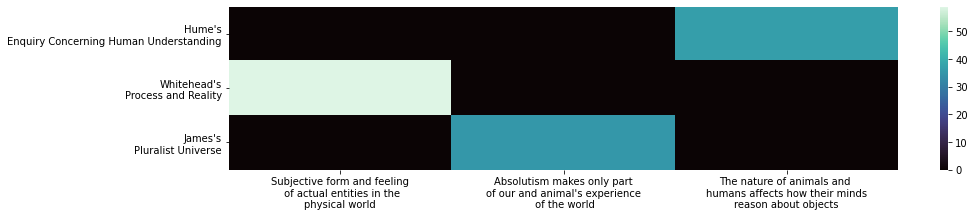

In [46]:
#plt.xlabals = topics_df.columns
#yticklabels=topics_df.iloc[:, 'book']
#xticklabels=topics_df.columns
sns.heatmap(np.array(topics_df.iloc[:,1:]), cmap='mako', xticklabels=topics_df.columns[1:], yticklabels=topics_df.loc[:, 'book'].to_list())

Based on snowball stemmed text, Whitehead's book is topically most distinctive

### NMF topic modeling using standard word stemming

In [87]:
from nltk.tokenize import word_tokenize

In [88]:
word_list_lists = [(word_tokenize(text)) for text in corpus_as_list]
word_list_lists_alpha = [ [word.lower() for word in text if word.isalpha()] for text in word_list_lists ]
tokenized_corpus_as_list = [' '.join(word_list) for word_list in word_list_lists_alpha]

In [89]:
tokenized_corpus_as_list

['section i of the different species of philosophy moral philosophy or the science of human nature may be treated after two different manners each of which has its peculiar merit and may contribute to the entertainment instruction and reformation of mankind the one considers man chiefly as born for action and as influenced in his measures by taste and sentiment pursuing one object and avoiding another according to the value which these objects seem to possess and according to the light in which they present themselves as virtue of all objects is allowed to be the most valuable this species of philosophers paint her in the most amiable colours borrowing all helps from poetry and eloquence and treating their subject in an easy and obvious manner and such as is best fitted to please the imagination and engage the affections they select the most striking observations and instances from common life place opposite characters in a proper contrast and alluring us into the paths of virtue by th

In [90]:
stemmed_tokenized_corpus_as_list = [stem_string_of_text(text) for text in tokenized_corpus_as_list ]

In [91]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [92]:
vectorizer = TfidfVectorizer(ngram_range=(1,1), stop_words='english')

In [93]:
X_tfidf = vectorizer.fit_transform(stemmed_tokenized_corpus_as_list)

In [94]:
X_tfidf.shape

(3, 6800)

In [95]:
vectorizer.get_feature_names()

['ab',
 'abandon',
 'abat',
 'abbrevi',
 'abbé',
 'aber',
 'aberr',
 'abid',
 'abil',
 'abl',
 'ablest',
 'abnorm',
 'abolish',
 'abomin',
 'aborigin',
 'abound',
 'abov',
 'abraham',
 'abreast',
 'abridg',
 'abroad',
 'abrupt',
 'absenc',
 'absent',
 'absolut',
 'absoluten',
 'absolutist',
 'absorb',
 'absorpt',
 'abstract',
 'abstracted',
 'abstrus',
 'absurd',
 'absurdo',
 'absurdum',
 'abund',
 'abus',
 'abyss',
 'academ',
 'acceler',
 'accent',
 'accentu',
 'acceperimus',
 'accepimus',
 'accept',
 'access',
 'accid',
 'accident',
 'accompani',
 'accomplish',
 'accord',
 'account',
 'accret',
 'accru',
 'accumul',
 'accur',
 'accuraci',
 'accurs',
 'accus',
 'accustom',
 'ach',
 'achiev',
 'achill',
 'acknowledg',
 'acoust',
 'acquaint',
 'acquiesc',
 'acquir',
 'acquisit',
 'acrimoni',
 'act',
 'action',
 'activ',
 'actor',
 'actual',
 'actuat',
 'acut',
 'ad',
 'adam',
 'adapt',
 'add',
 'addendum',
 'addison',
 'addit',
 'address',
 'adduc',
 'adequ',
 'adequaci',
 'adher',
 'ad

In [96]:
nmf_model = NMF(num_topics )
topics = nmf_model.fit_transform(X_tfidf )

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


In [103]:
words = vectorizer.get_feature_names()
topic_indices_sorted = nmf_model.components_.argsort(axis=1)[:, -1:-(number_of_word_features+1):-1]
topic_words = [[words[e] for e in word_list] for word_list in topic_indices_sorted]
topic_words

[['ani', 'reason', 'natur', 'object', 'caus', 'idea', 'effect'],
 ['actual', 'feel', 'entiti', 'subject', 'object', 'physic', 'nexus'],
 ['onli', 'absolut', 'thing', 'experi', 'relat', 'world', 'say']]

(3, 6800)

In [104]:
topic_words

[['ani', 'reason', 'natur', 'object', 'caus', 'idea', 'effect'],
 ['actual', 'feel', 'entiti', 'subject', 'object', 'physic', 'nexus'],
 ['onli', 'absolut', 'thing', 'experi', 'relat', 'world', 'say']]

In [105]:
number_of_word_features = 7

In [106]:
topic_names = [ 'The nature of animals and \nhumans affects how their minds\nreason about objects',\
                'Subjective form and feeling\n of a nexus of actual entities \nof the physical world',\
                'Absolutism makes only part\nof our and animal\'s experience\n of the world']

assert ('natur' in topic_words[0])
assert ('subject' in topic_words[1])
assert ('onli' in topic_words[2])

In [107]:
topics

array([[0.849514, 0.      , 0.      ],
       [0.000191, 1.064382, 0.000624],
       [0.000894, 0.000156, 1.155095]])

In [108]:
(topics > .7).astype(int)

array([[1, 0, 0],
       [0, 1, 0],
       [0, 0, 1]])

In [109]:
topics_df = pd.concat([pd.DataFrame(book_titles_list, columns=['book']), pd.DataFrame(topics)], axis=1)

In [110]:
topics_df

,book,0,1,2
0,Hume's\nEnquiry Concerning Human Understanding,0.849514,0.000000,0.000000
1,Whitehead's\nProcess and Reality,0.000191,1.064382,0.000624
2,James's\nPluralist Universe,0.000894,0.000156,1.155095


In [111]:
topics_df.rename(columns = dict(zip(range(num_topics), topic_names)), inplace=True)

In [112]:
topics_df.columns

Index(['book',
       'The nature of animals and \nhumans affects how their minds\nreason about objects',
       'Subjective form and feeling\n of a nexus of actual entities \nof the physical world',
       'Absolutism makes only part\nof our and animal's experience\n of the world'],
      dtype='object')

<AxesSubplot:>

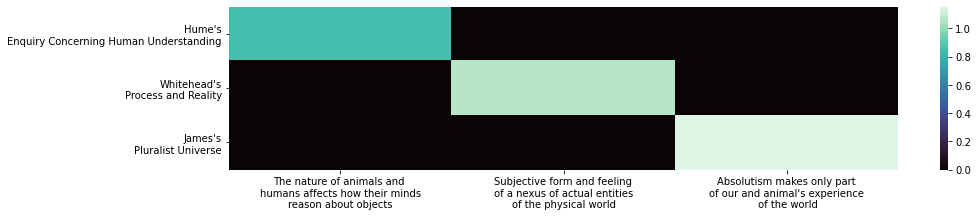

In [113]:
sns.heatmap(np.array(topics_df.iloc[:,1:]), cmap='mako', xticklabels=topics_df.columns[1:], yticklabels=topics_df.loc[:, 'book'].to_list())

## Word clouds
for each book

In [50]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [51]:
from io import BytesIO


def make_wordcloud(text, heading_):
    print ("There are {} words in the combination of all review.".format(len(text)))
    wordcl = WordCloud().generate(text)
    plt.figure()
    plt.imshow(wordcl, interpolation='bilinear')
    plt.title(heading_)
    plt.axis('off')
    plt.savefig(viz_path + heading_ + '.svg')
    plt.show()

    plt.close()


In [52]:

def prepare_wordcloud(book):
    book['main_text'].iloc[0]
    book_author = book['author'].iloc[0]
    book_title = book['title'].iloc[0]
    book_text = books_df.loc[books_df['title']==title_string,'main_text'].iloc[0] 
    heading = book_author + "\'s " + book_title
    return book_text, heading

There are 317202 words in the combination of all review.


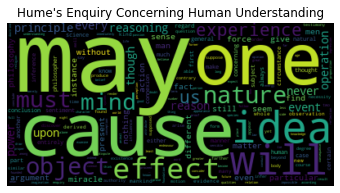

In [53]:
title_string = 'Enquiry Concerning Human Understanding'
book = books_df.loc[books_df['title']==title_string,:]

text, heading = prepare_wordcloud(book)
make_wordcloud( text, heading  )

There are 429035 words in the combination of all review.


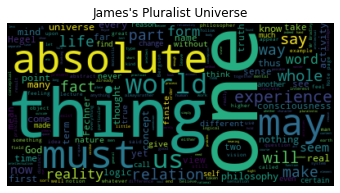

In [54]:
title_string = 'Pluralist Universe'
book = books_df.loc[books_df['title']==title_string,:]

text, heading = prepare_wordcloud(book)
make_wordcloud( text, heading  )

In [55]:
heading

"James's Pluralist Universe"

There are 986124 words in the combination of all review.


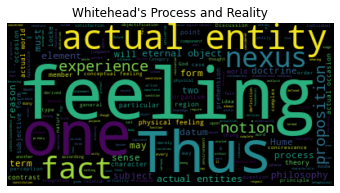

In [56]:
title_string = 'Process and Reality'
book = books_df.loc[books_df['title']==title_string,:]

text, heading = prepare_wordcloud(book)
make_wordcloud( text, heading  )

In [57]:
#books_text_only_df = pd.DataFrame(books_df['author','main_text'])
#books_text_only_df

In [58]:
books_df

,author,title,text,break_style,start_row_text,end_material_text,main_text,stemmed_main_text
0,Hume,Enquiry Concerning Human Understanding,﻿The Project Gutenberg EBook of An Enquiry Con...,SECTION I,SECTION I,INDEX,SECTION I. OF THE DIFFERENT SPECIES OF PHILOS...,section i. of the differ speci of philosophy....
1,Whitehead,Process and Reality,Skip to main content Search UPLOAD SIGN UP | L...,CHAPTER I,CHAPTER I,Index,CHAPTER I SPECULATIVE PHILOSOPHY SECTION I ...,chapter i specul philosophi section i [4] t...
2,James,Pluralist Universe,﻿The Project Gutenberg EBook of A Pluralistic ...,INDEX 401,INDEX 401,INDEX TO THE LECTURES,LECTURE I THE TYPES OF PHILOSOPHIC THINKI...,lectur i the type of philosoph think as t...


## Use SpaCy to generate a _Scattertext_ for each book in comparison to the other two
This has an x axis representing rare-to-frequently occuring words within the _other_ documents and a y axis representing rare-to-frequently occuring words in, for instance, the Whitehead

In [59]:
import spacy
import scattertext as st

In [60]:
nlp = spacy.load('en_core_web_sm')
#nlp = spacy.load('en')


corpus = st.CorpusFromPandas(books_df,
                             category_col='author',
                             text_col='main_text',
                             nlp=nlp).build()


In [61]:
corpus_ = corpus.get_unigram_corpus().compact(st.AssociationCompactor(2000))

In [62]:
import IPython

In [67]:
# visualize term associations
html = st.produce_scattertext_explorer(corpus_,
                                    category='Hume',
                                    category_name='Hume',
                                    not_category_name='Other',
                                    width_in_pixels=1000,
                                    minimum_term_frequency=5
                                    )
file_name = viz_path + 'Hume_scattertext.html'
open(file_name, 'wb').write(html.encode('utf-8'))
IPython.display.HTML(filename=file_name)

In [68]:
# visualize term associations
html = st.produce_scattertext_explorer(corpus_,
                                    category='James',
                                    category_name='James',
                                    not_category_name='Other',
                                    width_in_pixels=1000,
                                    minimum_term_frequency=3
                                    )
file_name = viz_path + 'James_scattertext.html'
open(file_name, 'wb').write(html.encode('utf-8'))
IPython.display.HTML(filename=file_name)

In [69]:
# visualize term associations
html = st.produce_scattertext_explorer(corpus_,
                                    category='Whitehead',
                                    category_name='Whitehead',
                                    not_category_name='Other',
                                    width_in_pixels=1000,
                                    minimum_term_frequency=3
                                    )
file_name = viz_path + 'Whitehead_scattertext.html'
open(file_name, 'wb').write(html.encode('utf-8'))
IPython.display.HTML(filename=file_name)

#### Unfortunately these generated interactive html pages don't seem to display properly within the j notebook

### TF-IDF without stemming, in order to trace differences and flux of _verbal semantic eccentricity or idiosyncrasy_

In [896]:
len(corpus_as_list)

3

In [978]:
import copy
corpus_as_list_extended = copy.deepcopy(corpus_as_list)
corpus_as_list_extended.extend(news_g_corpus)
len(corpus_as_list_extended)

11317

In [979]:
#word_list_lists = [(word_tokenize(text)) for text in corpus_as_list]
word_list_lists = [(word_tokenize(text)) for text in corpus_as_list_extended]
word_list_lists_alpha = [ [word.lower() for word in text if word.isalpha()] for text in word_list_lists ]
tokenized_corpus_as_list = [' '.join(word_list) for word_list in word_list_lists_alpha]

In [899]:
vectorizer = TfidfVectorizer(ngram_range=(1,1), stop_words='english')

In [900]:
X_tfidf_unstemmed = vectorizer.fit_transform(tokenized_corpus_as_list)

In [901]:
X_tfidf_unstemmed.shape

(11317, 75858)

In [902]:
book_titles_list

["Hume's\nEnquiry Concerning Human Understanding",
 "Whitehead's\nProcess and Reality",
 "James's\nPluralist Universe"]

In [903]:
len(vectorizer.get_feature_names())

75858

In [904]:
X_tfidf_unstemmed[0,:].todense()

matrix([[0., 0., 0., ..., 0., 0., 0.]])

In [905]:
X_tfidf_unstemmed[0,:].shape

(1, 75858)

### Try with Gensim instead, since it provides a lookup dictionary that I already understand

Gensim was ultimately abanoned in favor of sklearn's implementation of TF-IDF

### Try TF-IDF with sklearn instead of Gemsim

In [999]:
tokenized_corpus_as_list

['section i of the different species of philosophy moral philosophy or the science of human nature may be treated after two different manners each of which has its peculiar merit and may contribute to the entertainment instruction and reformation of mankind the one considers man chiefly as born for action and as influenced in his measures by taste and sentiment pursuing one object and avoiding another according to the value which these objects seem to possess and according to the light in which they present themselves as virtue of all objects is allowed to be the most valuable this species of philosophers paint her in the most amiable colours borrowing all helps from poetry and eloquence and treating their subject in an easy and obvious manner and such as is best fitted to please the imagination and engage the affections they select the most striking observations and instances from common life place opposite characters in a proper contrast and alluring us into the paths of virtue by th

In [1005]:
len(tokenized_corpus_as_list)

11317

## Comparing and adjusting the standard *TF-IDF*

In [1054]:
def from_sparse_compute_tfidf( tf_, idf_,):
    return np.array(tf_.todense()) * idf_

In [ ]:
# def from_sparse_compute_tfidf_alpha( tf_, idf_, alpha_):
#     tf = np.array(tf_.todense())
#     return (tf*(tf/(tf**alpha))* idf_ *alpha_**(idf_-1))

In [1135]:
# def from_sparse_compute_tfidf_alpha( tf_, idf_, alpha_):
#     tf = np.array(tf_.todense())
#     return (tf*(tf/(tf**alpha))* idf_ *alpha_**(idf_-1))

In [1746]:
#tokenized_corpus_as_list

### Alpha scaled TF-IDF

### _Alpha scaled TF-IDF_ defined and explained: 

TF * IDF + (_e_<sup>IDF</sup> - IDF) * $\alpha$

Standard/traditional/vanilla TF-IDF balances the prevalence of each word within a document with its prevelance within the corpus, but does so in only a limited way, which may become a severe limitation when the available corpus is significantly smaller sample than the entire population of documents whose context is relevant.  _Alpha scaled TF-IDF_ addresses this by amplifyiing the effect of rareness of words in relation ot the document corpus, by providing a hyperparameter alpha, which, when tuned to greater than zero, amplifies the effect of word rarity. When alpha is tuned to 1 this entirely cancels out the log applied in standard TF-IDF so that the the value is like the original inverse document frequency.  When alpha is set to below zero this dampens to the effect of word rarity in favor of prevelance of the word within the document. Alpha scaling allows one to scale IDF to anywhere in the range from log(inverse document frequency) to raw inverse document frequency via values of alpha ranging from 0 to 1. One can also set alpha beyond this range (below or above) to amplify or dampen the effect of intra vs. inter document prevelance of the word.


In [1886]:
def from_sparse_compute_alpha_scaled_tfidf( tf_, idf_, alpha_):
    #tf = np.array(tf_.todense())
    #return tf_ * (idf_ + (np.exp(idf_) - idf_)*alpha_)
    tf = np.array(tf_matrix.todense())
    alpha_scaled_idf = idf_vec +           (np.exp(idf_vec) - idf_vec ) * alpha_
    return tf * alpha_scaled_idf 

In [1887]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
# our corpus
#data = ['I like dog', 'I love cat', 'I interested in cat']
data = tokenized_corpus_as_list

cv = CountVectorizer(stop_words="english")

# convert text data into term-frequency matrix
data = cv.fit_transform(data)

tf_transformer    = TfidfTransformer(  use_idf=False)
# 
#tfidf_transformer = TfidfTransformer(  use_idf=True)


tf_matrix    = tf_transformer.fit_transform( data ) 
# convert term-frequency matrix into tf-idf
#tfidf_matrix = tfidf_transformer.fit_transform(data)


tfidf_transformer = TfidfTransformer(  use_idf=True)
idf_vec = tfidf_transformer.fit(data).idf_

#alpha = 1.2
#tfidf_alpha = from_sparse_compute_tfidf_alpha( tf_matrix, idf_vec, alpha)
tfidf_computed = from_sparse_compute_tfidf( tf_matrix, idf_vec)



# create dictionary to find a tfidf word each word
#word2tfidf = dict(zip(cv.get_feature_names(), tfidf_transformer.idf_))

In [1888]:
# tf = np.array(tf_matrix.todense())

# ( tf*((idf_vec+np.exp(idf_vec) )*alpha_low)).shape

In [1889]:
idf_vec.shape

(75858,)

In [1890]:
(np.exp(idf_vec) - np.array(idf_vec)).shape

(75858,)

In [1891]:
alpha_low = .0053
alpha_scaled_tfidf = from_sparse_compute_alpha_scaled_tfidf( tf_matrix, idf_vec, alpha_low )

In [1892]:
alpha_scaled_tfidf.shape

(11317, 75858)

In [1893]:
tfidf_alpha.shape

(11317, 75858)

In [1894]:
data

<11317x75858 sparse matrix of type '<class 'numpy.int64'>'
	with 1042688 stored elements in Compressed Sparse Row format>

In [1895]:
tfidf_alpha_df = pd.DataFrame(alpha_scaled_tfidf, columns = cv.get_feature_names())

In [1896]:
#tfidf_alpha_df = pd.DataFrame(tfidf_alpha, columns = cv.get_feature_names())

In [1897]:
#tfidf_computed_df = pd.DataFrame(tfidf_computed, columns = cv.get_feature_names())

In [1898]:
word1 = 'prehensions'
word2='concrescence'
word3='actual'
word4 = 'organism'

In [1899]:
document = 1

In [1900]:
np.set_printoptions(precision=4)

In [1901]:
print(tfidf_alpha_df.loc[document ,word1],tfidf_alpha_df.loc[document,word2], tfidf_alpha_df.loc[document ,word3],tfidf_alpha_df.loc[document,word4]) 

6.054635431485693 5.275325920502385 2.5082431445088966 0.7875035493147892


In [1874]:
print(tfidf_alpha_df.loc[document ,word1],tfidf_alpha_df.loc[document,word2], tfidf_alpha_df.loc[document ,word3],tfidf_alpha_df.loc[document,word4]) 

5.952484282058835 5.1863229388235395 2.5017658450427414 0.780151099401274


In [1902]:
print(tfidf_computed_df.loc[document ,word1],tfidf_computed_df.loc[document,word2], tfidf_computed_df.loc[document ,word3],tfidf_computed_df.loc[document,word4]) 

0.6406245118623161 0.558167891523602 2.1649462728026605 0.39782370389849026


In [1903]:
print(tfidf_df.loc[document ,word1],tfidf_df.loc[document,word2], tfidf_df.loc[document ,word3],tfidf_df.loc[document,word4]) 

3.0960566249302204 2.697554287067914 4.531125272377645 1.2317084425293052


In [1904]:
tfidf_df.loc[1,'feeling']*word2tfidf['feeling'] 

17.70427017330655

In [1905]:
tfidf_df.loc[1,'concrescence']*word2tfidf['concrescence'] 

26.007127563848194

In [968]:
#tfidf_df.loc[1,'prehensions']

In [1812]:
tfidf_df.loc[1,'prehensions']*word2tfidf['prehensions'] 

29.849089590325775

In [1906]:
tfidf_alpha_df.loc[1, 'feeling']

1.7958044514524787

In [1907]:
tfidf_alpha_df.loc[1, 'nexus']

3.881890874892562

In [1908]:
tfidf_matrix.shape

(11317, 75858)

### Gensim
This code block was ultimately not used

In [1217]:
import gensim
from gensim.parsing.preprocessing import remove_stopwords, preprocess_string

In [1218]:
philosophy_docs = [gensim.utils.simple_preprocess(gensim.parsing.preprocessing.remove_stopwords(d)) for d in tokenized_corpus_as_list ]
#philosophy_docs = [gensim.parsing.preprocessing.preprocess_string(d) for d in tokenized_corpus_as_list ]

philosophy_dict = gensim.corpora.Dictionary()
philosophy_dict

#philosophy_corpus = [philosophy_dict.doc2bow(doc, allow_update=True) for doc in philosophy_docs]
philosophy_corpus = [philosophy_dict.doc2bow(doc, allow_update=True) for doc in philosophy_docs]

In [1219]:
philosophy_docs

[['section',
  'different',
  'species',
  'philosophy',
  'moral',
  'philosophy',
  'science',
  'human',
  'nature',
  'treated',
  'different',
  'manners',
  'peculiar',
  'merit',
  'contribute',
  'entertainment',
  'instruction',
  'reformation',
  'mankind',
  'considers',
  'man',
  'chiefly',
  'born',
  'action',
  'influenced',
  'measures',
  'taste',
  'sentiment',
  'pursuing',
  'object',
  'avoiding',
  'according',
  'value',
  'objects',
  'possess',
  'according',
  'light',
  'present',
  'virtue',
  'objects',
  'allowed',
  'valuable',
  'species',
  'philosophers',
  'paint',
  'amiable',
  'colours',
  'borrowing',
  'helps',
  'poetry',
  'eloquence',
  'treating',
  'subject',
  'easy',
  'obvious',
  'manner',
  'best',
  'fitted',
  'imagination',
  'engage',
  'affections',
  'select',
  'striking',
  'observations',
  'instances',
  'common',
  'life',
  'place',
  'opposite',
  'characters',
  'proper',
  'contrast',
  'alluring',
  'paths',
  'virtue',

In [983]:
phil_doc_term_matrix = gensim.matutils.corpus2dense(philosophy_corpus, num_terms=len(philosophy_dict))

phil_tfidf = gensim.models.TfidfModel(philosophy_corpus)
phil_tfidf_matrix = gensim.matutils.corpus2dense(phil_tfidf[philosophy_corpus], num_terms=len(philosophy_dict))

In [994]:
phil_idf_matrix  = gensim.models.tfidfmodel.precompute_idfs()

TypeError: precompute_idfs() missing 3 required positional arguments: 'wglobal', 'dfs', and 'total_docs'

In [989]:
phil_doc_term_matrix[philosophy_dict.token2id[ 'actual' ], 1]

1303.0

In [990]:
phil_tfidf_matrix[philosophy_dict.token2id[ 'actual' ], 1]

0.35669464

In [993]:
gensim.models.tfidfmodel.df2idf(1, philosophy_dict.token2id[ 'actual' ], add=0.0)

6.266786540694902

In [917]:
word2tfidf['nexus'] 

8.388239508647157

In [918]:
word2tfidf['feeling'] 

5.364336358126469

#### Function to compute semantic verbal eccentricity (idiosyncrasy) based on alpha scaled TF-IDF 

In [1177]:
def semantic_intensity( token, doc_num ):
    try:
        return tfidf_alpha_df.loc[doc_num ,token]
        #return phil_tfidf_matrix[philosophy_dict.token2id[ token ], doc_num]
        #return tfidf_df.loc[doc_num,token]*word2tfidf[ token ]
    except:
        return 0
    

In [920]:
philosophy_docs

[['section',
  'different',
  'species',
  'philosophy',
  'moral',
  'philosophy',
  'science',
  'human',
  'nature',
  'treated',
  'different',
  'manners',
  'peculiar',
  'merit',
  'contribute',
  'entertainment',
  'instruction',
  'reformation',
  'mankind',
  'considers',
  'man',
  'chiefly',
  'born',
  'action',
  'influenced',
  'measures',
  'taste',
  'sentiment',
  'pursuing',
  'object',
  'avoiding',
  'according',
  'value',
  'objects',
  'possess',
  'according',
  'light',
  'present',
  'virtue',
  'objects',
  'allowed',
  'valuable',
  'species',
  'philosophers',
  'paint',
  'amiable',
  'colours',
  'borrowing',
  'helps',
  'poetry',
  'eloquence',
  'treating',
  'subject',
  'easy',
  'obvious',
  'manner',
  'best',
  'fitted',
  'imagination',
  'engage',
  'affections',
  'select',
  'striking',
  'observations',
  'instances',
  'common',
  'life',
  'place',
  'opposite',
  'characters',
  'proper',
  'contrast',
  'alluring',
  'paths',
  'virtue',

In [1909]:
import seaborn as sns
from matplotlib import pyplot as plt

## Comparing the books in terms of overall verbal semantic eccentricity (idiosyncrasy)

### Hume

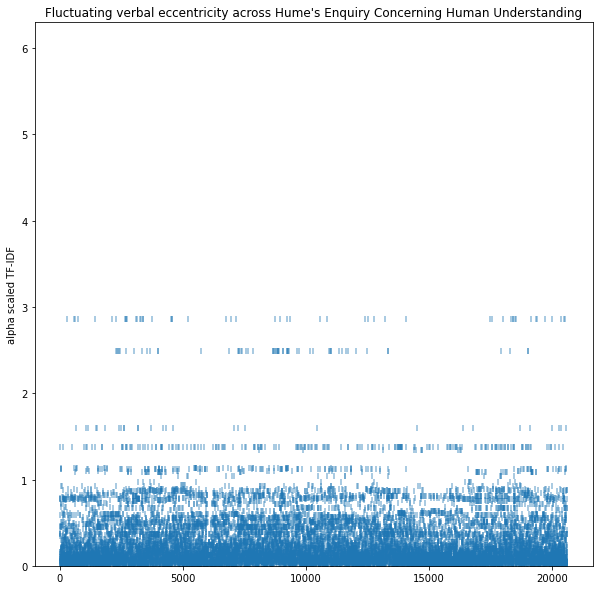

In [1910]:

doc_num = 0
philosophy_doc_intensities = [semantic_intensity(word, doc_num) for word in philosophy_docs[ doc_num ]]
#philosophy_doc_intensities = philosophy_doc_intensities[:90000]

plt.rcParams["figure.figsize"] = [10,10]
fig, ax = plt.subplots(nrows=1, ncols=1)

ax.scatter(range(len(philosophy_doc_intensities)), philosophy_doc_intensities, alpha=.5, marker='|')
#plt.yscale('log')
#plt.ylim((pow(10,0),pow(10,4)))
#plt.ylim(0, 2)
plt.ylim(0,6.3)
#plt.ylim((pow(10,0),pow(10,.8)))
plt.ylabel("alpha scaled TF-IDF")
#ax.set_xticks(range( len(doc1_list)))
#ax.set_xticklabels(doc1_list)

heading_ = "Fluctuating verbal eccentricity across " + book_titles_list[doc_num].replace('\n', ' ')
ax.set_title( heading_ )
plt.savefig(viz_path + heading_ + '.svg')
plt.show()


In [1911]:
list_of_tuplets = list(zip(philosophy_docs[doc_num] , philosophy_doc_intensities))
words_sorted_by_intensity = sorted(list_of_tuplets, key= lambda x: x[1])
temp_df = pd.DataFrame(words_sorted_by_intensity).groupby(by=0).agg('mean').sort_values(by=1, ascending=False).head(50)
temp_df

,1
0,
reasonings,2.863623
connexion,2.489574
enquiry,1.597020
nature,1.373196
prodigies,1.336804
sentiment,1.134092
objects,1.127381
faculties,1.101393
qualities,1.092295


In [1912]:
philosophy_docs[1]

['chapter',
 'speculative',
 'philosophy',
 'section',
 'course',
 'lectures',
 'designed',
 'essay',
 'speculative',
 'philosophy',
 'task',
 'define',
 'speculative',
 'defend',
 'method',
 'productive',
 'important',
 'knowledge',
 'speculative',
 'philosophy',
 'endeavour',
 'frame',
 'coherent',
 'logical',
 'necessary',
 'general',
 'ideas',
 'terms',
 'element',
 'experience',
 'interpreted',
 'notion',
 'interpretation',
 'mean',
 'conscious',
 'enjoyed',
 'perceived',
 'willed',
 'thought',
 'shall',
 'character',
 'particular',
 'instance',
 'general',
 'scheme',
 'philosophical',
 'scheme',
 'coherent',
 'logical',
 'respect',
 'interpretation',
 'applicable',
 'adequate',
 'applicable',
 'means',
 'items',
 'experience',
 'interpretable',
 'adequate',
 'means',
 'items',
 'incapable',
 'interpretation',
 'coherence',
 'employed',
 'means',
 'fundamental',
 'ideas',
 'terms',
 'scheme',
 'developed',
 'presuppose',
 'isolation',
 'meaningless',
 'requirement',
 'mean',
 'def

### Whitehead

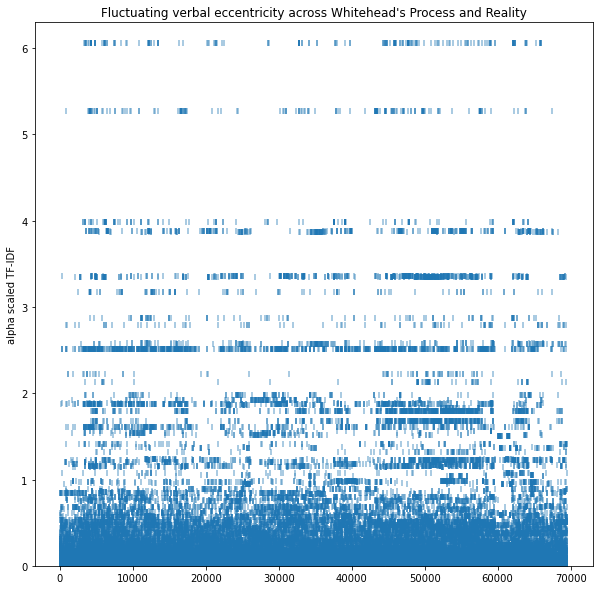

In [1913]:
doc_num=1
philosophy_doc_intensities = [semantic_intensity(word, doc_num) for word in philosophy_docs[ doc_num ]]

plt.rcParams["figure.figsize"] = [10,10]
fig, ax = plt.subplots(nrows=1, ncols=1)
#plt.yscale('log')
#plt.ylim((pow(10,0),pow(10,.8)))
plt.ylim(0, 6.3)
ax.scatter(range(len(philosophy_doc_intensities)), philosophy_doc_intensities, alpha=.5, marker='|')
plt.ylabel("alpha scaled TF-IDF")
#ax.set_xticks(range( len(doc1_list)))
#ax.set_xticklabels(doc1_list)
heading_ = "Fluctuating verbal eccentricity across " + book_titles_list[doc_num].replace('\n', ' ')
ax.set_title( heading_ )


plt.savefig(viz_path + heading_ + '.svg')
plt.show()


In [1914]:
len(philosophy_doc_intensities)

69533

In [1820]:
window_size = 1000
x_points = range(0, len(philosophy_doc_intensities)-window_size)
len(x_points)

68533

#### 1000-word moving-window average across all of Whitehead

In [1821]:

mov_avg = [np.mean(philosophy_doc_intensities[n:n+window_size]) for n in x_points]

(0.0, 1.5)

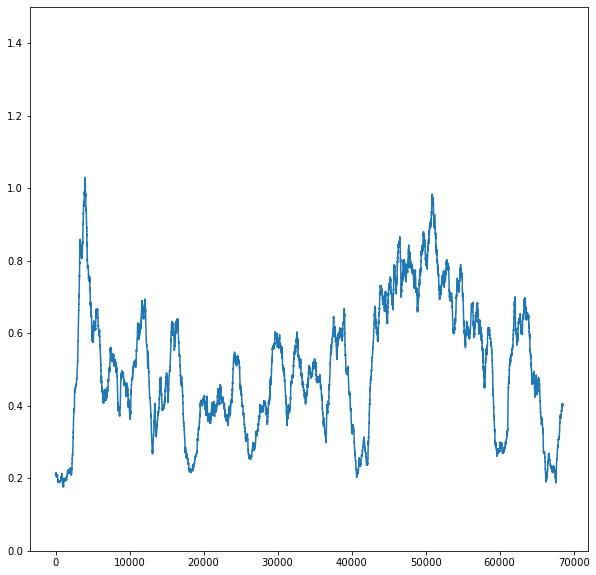

In [1917]:
sns.lineplot(x=x_points, y= mov_avg )
plt.ylim(0,1.5)

#### Whitehead's most idiosyncratic prevelant words

In [1825]:
doc_num

1

In [1918]:
list_of_tuplets = list(zip(philosophy_docs[doc_num] , philosophy_doc_intensities))
words_sorted_by_intensity = sorted(list_of_tuplets, key= lambda x: x[1])
temp_df = pd.DataFrame(words_sorted_by_intensity).groupby(by=0).agg('mean').sort_values(by=1, ascending=False).head(50)
temp_df

,1
0,
prehensions,6.054635
concrescence,5.275326
prehension,3.986468
nexus,3.881891
presentational,3.866574
datum,3.357837
conceptual,3.348431
potentiality,3.177185
objectification,2.877451


In [1919]:
search_term = 'prehension'
search_term_indices = [index for index, value in enumerate(philosophy_docs[1]) if value==search_term]

In [1920]:
search_term_indices[:10]

[3177, 3216, 3380, 3403, 3410, 3420, 3963, 4218, 4256, 4274]

In [1349]:
index = search_term_indices[-25]
the_doc_num = 1
print( philosophy_docs[the_doc_num][index-1] + ' ' + philosophy_docs[the_doc_num][index]  + ' ' + philosophy_docs[the_doc_num][index+1] ) 




negative prehension actualities


In [1350]:
philosophy_docs[the_doc_num][search_term_indices[-25] - 9: search_term_indices[-25] + 1]

['given',
 'concrescence',
 'included',
 'positively',
 'means',
 'conceptual',
 'feeling',
 'excluded',
 'negative',
 'prehension']

### Tracking verbal semantic idiosyncrasy word-by-word
#### looking for particularly idiosyncratic phrases to plot word-by-word

In [1351]:
phi_docs = philosophy_docs
[phi_docs[1][i-2]+' ' +phi_docs[1][i-1]+' ' +phi_docs[1][i] +' '+ phi_docs[1][i+1] +' '+ phi_docs[1][i+2] for i in search_term_indices]



['notions actual prehension ontological philosophical',
 'concreteness entity prehension endeavour base',
 'quota prehensions prehension reproduces general',
 'entity reproduced prehension complete actuality',
 'incomplete partiality prehension subordinate element',
 'required reason prehension respect subjective',
 'synthesis entities prehension patterned entities',
 'termed xi prehension consists factors',
 'forms type prehension xii species',
 'forms negative prehension holds datum',
 'called terms prehension feeling compared',
 'outcome fact prehension considered abstraction',
 'integrated conceptual prehension quenching appetition',
 'novel conceptual prehension especially accounted',
 'pole impurity prehension refers prehension',
 'prehension refers prehension arising integration',
 'impure mental prehension impure physical',
 'impure physical prehension conversely term',
 'impure applied prehension perfectly definite',
 'term conceptual prehension entirely neutral',
 'synthesis 

### Whitehead excerpt 1

In [1921]:
excerpt = 'In any given concrescence, it may be included positively by means of a conceptual feeling; but it may be excluded by a negative prehension.'

In [1922]:
excerpt.split()

['In',
 'any',
 'given',
 'concrescence,',
 'it',
 'may',
 'be',
 'included',
 'positively',
 'by',
 'means',
 'of',
 'a',
 'conceptual',
 'feeling;',
 'but',
 'it',
 'may',
 'be',
 'excluded',
 'by',
 'a',
 'negative',
 'prehension.']

In [1923]:
#word_sequence = excerpt.split()
[semantic_intensity(re.sub(r'\W+', '', word).lower(), doc_num) for word in excerpt.split()]

[0,
 0,
 0.142032413181541,
 5.275325920502385,
 0,
 0,
 0,
 0.0913564776322603,
 0.03846455495662906,
 0,
 0.11237462896603079,
 0,
 0,
 3.348431326131519,
 1.7958044514524787,
 0,
 0,
 0,
 0,
 0.043783194547571916,
 0,
 0,
 0.13276547997852273,
 3.986467883106916]

In [1924]:
semantic_intensity('given',1)

0.142032413181541

In [1925]:
word_list = [re.sub(r'\W+', '', word) for word in excerpt.split()]
philosophy_excerpt_intensities = [semantic_intensity(word,1) for word in word_list]
philosophy_excerpt_intensities 

[0,
 0,
 0.142032413181541,
 5.275325920502385,
 0,
 0,
 0,
 0.0913564776322603,
 0.03846455495662906,
 0,
 0.11237462896603079,
 0,
 0,
 3.348431326131519,
 1.7958044514524787,
 0,
 0,
 0,
 0,
 0.043783194547571916,
 0,
 0,
 0.13276547997852273,
 3.986467883106916]

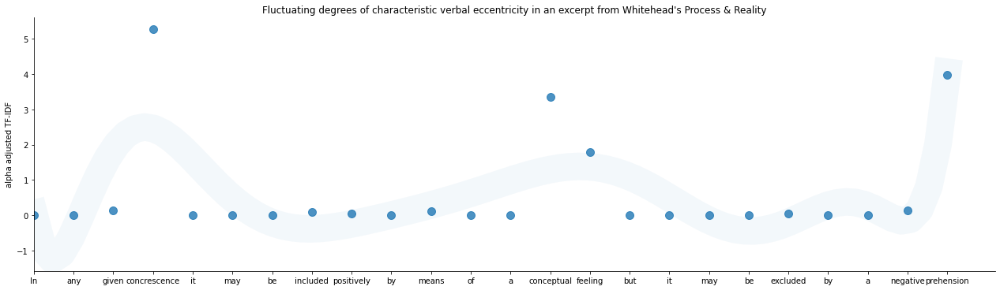

In [1932]:
heading_ = "Fluctuating degrees of characteristic verbal eccentricity in an excerpt from Whitehead's Process & Reality"
num_x_points = len(philosophy_excerpt_intensities)
plt.rcParams["figure.figsize"] = [25,6]
plot_df = pd.DataFrame({'word': range(num_x_points), 'alpha adjusted TF-IDF': philosophy_excerpt_intensities} )

g=sns.lmplot(x='word', y='alpha adjusted TF-IDF', data=plot_df, 
         aspect=3.5,   ci=None, order =10, scatter_kws={'s':100}, line_kws={'lw':35, 'alpha':.05});
#g.set(ylim=(0, 6))
g.set(xlim=(0, num_x_points+.2))
g.set(xticks =  range(num_x_points) )
g.set(xticklabels= word_list)
g.set(xlabel= '')
plt.title(heading_)
plt.show()
g.savefig(viz_path + heading_ + '.svg')
#g.set_axis_labels('Colors', word_sequence)
#g.set(xlim=(0, 5))

In [1933]:
from statsmodels.nonparametric.smoothers_lowess import lowess
y=philosophy_excerpt_intensities
x=range(num_x_points)
y_hat1 = lowess(y, x, frac=2/3)

In [1934]:
y_hat1

array([[ 0.    ,  0.0146],
       [ 1.    ,  0.0168],
       [ 2.    ,  0.0189],
       [ 3.    ,  0.0211],
       [ 4.    ,  0.0234],
       [ 5.    ,  0.0255],
       [ 6.    ,  0.0273],
       [ 7.    ,  0.0281],
       [ 8.    ,  0.0273],
       [ 9.    ,  0.026 ],
       [10.    ,  0.0238],
       [11.    ,  0.0212],
       [12.    ,  0.0184],
       [13.    ,  0.0155],
       [14.    ,  0.0124],
       [15.    ,  0.01  ],
       [16.    ,  0.0091],
       [17.    ,  0.0131],
       [18.    ,  0.0185],
       [19.    ,  0.0248],
       [20.    ,  0.0317],
       [21.    ,  0.0391],
       [22.    ,  0.047 ],
       [23.    ,  0.0556]])

In [1935]:
y_hat1[:, 0]

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23.])

In [1936]:
df = pd.DataFrame({'words': y_hat1[:,0], 'verbal idiosyncrasy': y_hat1[:, 1]})

In [1937]:
df

,words,verbal idiosyncrasy
0,0.0,0.014649
1,1.0,0.016767
2,2.0,0.018902
3,3.0,0.021139
4,4.0,0.023411
5,5.0,0.025541
6,6.0,0.027276
7,7.0,0.028073
8,8.0,0.027324
9,9.0,0.025972


In [1938]:
import plotly.graph_objects as go # for data visualization
import plotly.express as px # for data visualization 

In [1940]:
import scipy

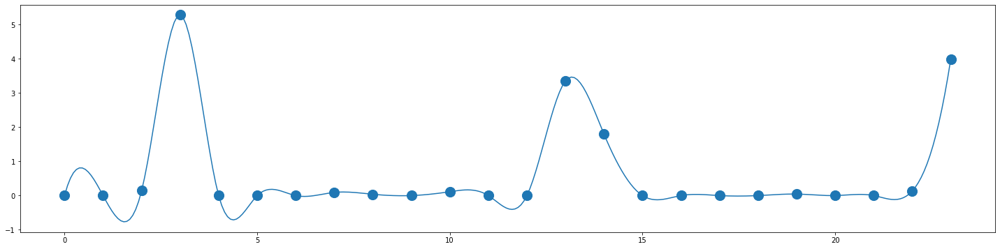

In [1941]:
x_new = np.linspace(0, 23, 300)
a_BSpline = scipy.interpolate.make_interp_spline(x, philosophy_excerpt_intensities, 3)
y_new = a_BSpline(x_new)

g = plt.plot(x_new, y_new)
plt.scatter(x, philosophy_excerpt_intensities, s=200)
#g.set(xticklabels= word_list)
#g.xticklabels= word_list

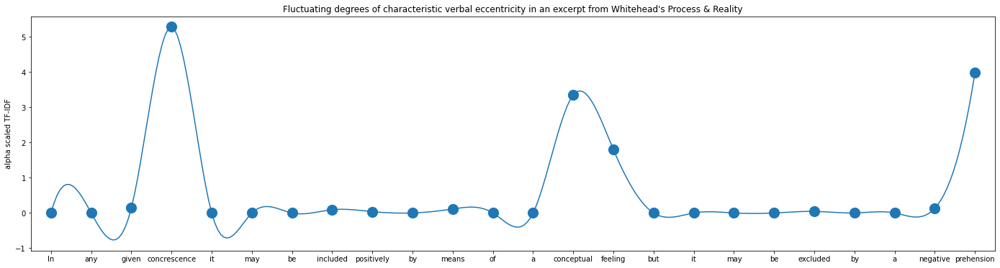

In [2016]:
heading_ = "Fluctuating degrees of characteristic verbal eccentricity in an excerpt from Whitehead's Process & Reality"

num_x_points = len(philosophy_excerpt_intensities)
x=range(num_x_points)
plt.rcParams["figure.figsize"] = [24,6]
plot_df = pd.DataFrame({'word': range(num_x_points), 'alpha adjusted TF-IDF': philosophy_excerpt_intensities} )


fig, ax = plt.subplots(nrows=1, ncols=1)#
#fig, ax = plt.plot()

x_new = np.linspace(0, 23, 300)
a_BSpline = scipy.interpolate.make_interp_spline(x, philosophy_excerpt_intensities, 3)
y_new = a_BSpline(x_new)

plt.scatter(x, philosophy_excerpt_intensities, s=200)
plt.plot(x_new, y_new)


#g=sns.lmplot(x='word', y='alpha adjusted TF-IDF', data=plot_df, 
#         aspect=3.5,   ci=None, order =10, scatter_kws={'s':100}, line_kws={'lw':35, 'alpha':.05});

    #g.set(ylim=(0, 6))
#ax.set(xlim=(0, num_x_points+.2))
ax.set(xticks =  range(num_x_points) )
ax.set(xticklabels= word_list)
ax.set(xlabel= '')
ax.set(xlim=(-.5, 23.5))
ax.set(ylabel= 'alpha scaled TF-IDF')
plt.title(heading_)
fig.savefig(viz_path + heading_ + '.svg')
plt.show()


In [1944]:
len(range(len(philosophy_excerpt_intensities)))

24

In [1945]:
len(philosophy_excerpt_intensities)

24

<AxesSubplot:title={'center':"Fluctuating verbal eccentricity in an excerpt from Alfred North Whitehead's Process and Reality'"}, ylabel='TF-IDF'>

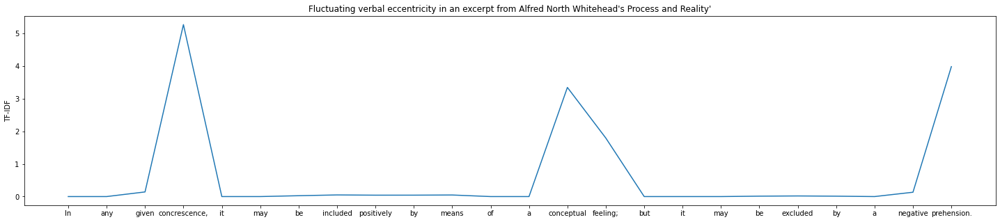

In [1946]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
import statsmodels.api as sm
#x = np.random.uniform(low = -2*np.pi, high = 2*np.pi, size=500)
x_ = range(len(philosophy_excerpt_intensities))
#y = np.sin(x) + np.random.normal(size=len(x))
y_ = philosophy_excerpt_intensities
z = lowess(y_, x_, frac= 1./6, it=0)
w = lowess(y_, x_, frac=.19)
plt.rcParams["figure.figsize"] = [25,5]

fig, ax = plt.subplots(nrows=1, ncols=1)
plt.ylabel("TF-IDF")
ax.set_title("Fluctuating verbal eccentricity in an excerpt from Alfred North Whitehead\'s Process and Reality'")
ax.set_xticks(range( len(philosophy_excerpt_intensities)))
ax.set_xticklabels(word_sequence)

sns.lineplot(x=x_, y= w[:,1])

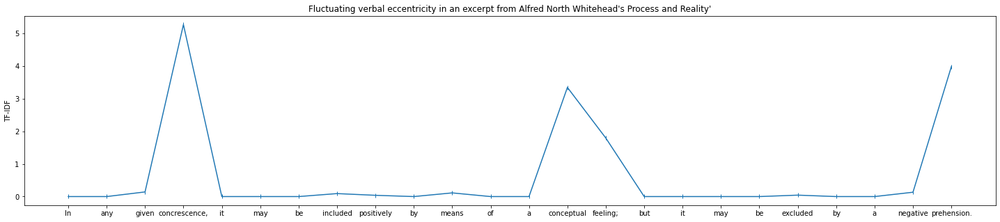

In [1947]:
import re

#word_sequence = excerpt.split()
#philosophy_excerpt_intensities = [semantic_intensity(re.sub(r'\W+', '', word).lower(), doc_num) for word in word_sequence ]
#philosophy_doc_intensities = philosophy_doc_intensities[:90000]


plt.rcParams["figure.figsize"] = [25,5]
fig, ax = plt.subplots(nrows=1, ncols=1)
plt.ylabel("TF-IDF")
ax.plot(range(len(philosophy_excerpt_intensities)), philosophy_excerpt_intensities, alpha=1, marker='|')
ax.set_title("Fluctuating verbal eccentricity in an excerpt from Alfred North Whitehead\'s Process and Reality'")
ax.set_xticks(range( len(philosophy_excerpt_intensities)))
ax.set_xticklabels(word_sequence)
plt.savefig(viz_path + 'Flux_of_semantic_intensity' + '.svg')
#plt.ylim(0,14000)


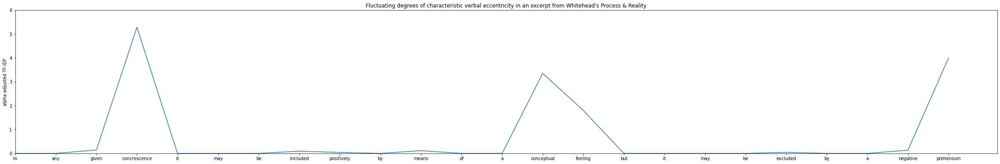

In [1948]:
heading_ = "Fluctuating degrees of characteristic verbal eccentricity in an excerpt from Whitehead's Process & Reality"
num_x_points = len(philosophy_excerpt_intensities)
plt.rcParams["figure.figsize"] = [40,6]
plot_df = pd.DataFrame({'word': range(num_x_points), 'alpha adjusted TF-IDF': philosophy_excerpt_intensities} )

#g=sns.lmplot(x='word', y='alpha adjusted TF-IDF', data=plot_df, 
#        aspect=3.5,   ci=None, order =14, scatter_kws={'s':1000}, line_kws={'lw':45, 'alpha':.05});
g=sns.lineplot(x='word', y='alpha adjusted TF-IDF', data=plot_df, 
           ci=None);

g.set(ylim=(0, 6))
g.set(xlim=(0, num_x_points+.2))
g.set(xticks =  range(num_x_points) )
#g.set(xticklabels= word_sequence)
g.set(xticklabels= word_list)
g.set(xlabel= '')
plt.title(heading_)

plt.savefig(viz_path + heading_ + '.svg')
plt.show()
#g.set_axis_labels('Colors', word_sequence)
#g.set(xlim=(0, 5))

### Whitehead excerpt 2

In [1949]:
excerpt2 = '''In a process of concrescence, there is a succession of phases in 
which new prehensions arise by integration of prehensions in antecedent 
phases. In these integrations 'feelings' contribute their 'subjective forms 7 
and their 'data' to the formation of novel integral prehensions; but 'nega- 
tive prehensions' contribute only their 'subjective forms/ The process con- 
tinues till all prehensions are components in the one determinate integral 
satisfaction.'''

In [1950]:
word_list2 = [re.sub(r'\W+', '', word) for word in excerpt2.split()]
philosophy_excerpt_intensities2 = [semantic_intensity(word,1) for word in word_list2]
philosophy_excerpt_intensities2 

[0,
 0,
 0.4777605214008666,
 0,
 5.275325920502385,
 0,
 0,
 0,
 0.10346276569507501,
 0,
 0.5679440737849907,
 0,
 0,
 0.08177072806340883,
 6.054635431485693,
 0.2163115522952613,
 0,
 0.3846738365835419,
 0,
 6.054635431485693,
 0,
 1.078256454735491,
 0.5679440737849907,
 0,
 0,
 0.5095485264121622,
 1.6791888294475095,
 0.039287253010830914,
 0,
 1.1575285868782832,
 0.37433641434206216,
 0,
 0,
 0,
 0.2178273921404062,
 0,
 0,
 0.05815773923075756,
 0,
 0.2589555041501931,
 0.16246574866993965,
 6.054635431485693,
 0,
 0,
 0.013582320687829377,
 6.054635431485693,
 0.039287253010830914,
 0,
 0,
 1.1575285868782832,
 0.37433641434206216,
 0,
 0.4777605214008666,
 0,
 0,
 0.008319997119479849,
 0,
 6.054635431485693,
 0,
 0.18174036178846656,
 0,
 0,
 0,
 1.1436053307800662,
 0.16246574866993965,
 0.6986027192807405]

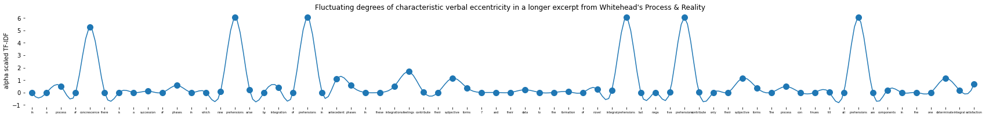

In [2017]:
heading_ = "Fluctuating degrees of characteristic verbal eccentricity in a longer excerpt from Whitehead's Process & Reality"
num_x_points2 = len(philosophy_excerpt_intensities2)
x=range(num_x_points2)
plt.rcParams["figure.figsize"] = [30,3]
plot_df2 = pd.DataFrame({'word': range(num_x_points2), 'alpha adjusted TF-IDF': philosophy_excerpt_intensities2} )


fig, ax = plt.subplots(nrows=1, ncols=1)#
#fig, ax = plt.plot()

x_new = np.linspace(0, 65, 300)
a_BSpline = scipy.interpolate.make_interp_spline(x, philosophy_excerpt_intensities2, 3)
y_new = a_BSpline(x_new)

plt.scatter(x, philosophy_excerpt_intensities2, s=100)
plt.plot(x_new, y_new)


#g=sns.lmplot(x='word', y='alpha adjusted TF-IDF', data=plot_df, 
#         aspect=3.5,   ci=None, order =10, scatter_kws={'s':100}, line_kws={'lw':35, 'alpha':.05});

    #g.set(ylim=(0, 6))
#ax.set(xlim=(0, num_x_points+.2))
ax.set(xticks =  range(num_x_points2) )
#ax.set(xticklabels= word_list2, fontsize=12)

ax.set_xticklabels(word_list2, fontsize= 5 )
#plt.setp(ax.get_xticklabels(), fontsize=)
#ax.tick_params(axis='x', labelsize= )


ax.set(xlabel= '')
ax.set(xlim=(-.5, 66.5))
ax.set(ylabel= 'alpha scaled TF-IDF')
plt.title(heading_)
plt.box(False)
fig.savefig(viz_path + heading_ + '.svg')
plt.show()


In [1952]:
len(philosophy_excerpt_intensities)

24

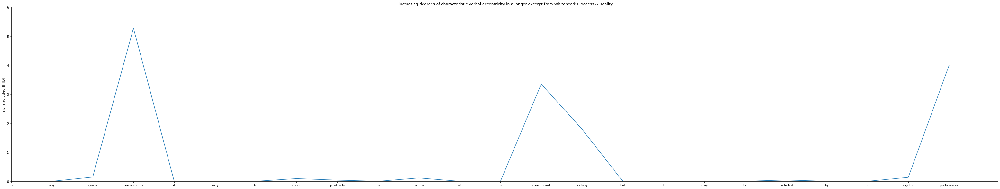

In [1953]:
heading_ = "Fluctuating degrees of characteristic verbal eccentricity in a longer excerpt from Whitehead's Process & Reality"
num_x_points = len(philosophy_excerpt_intensities)
plt.rcParams["figure.figsize"] = [55,10]
plot_df = pd.DataFrame({'word': range(num_x_points), 'alpha adjusted TF-IDF': philosophy_excerpt_intensities} )

#g=sns.lmplot(x='word', y='alpha adjusted TF-IDF', data=plot_df, 
#        aspect=3.5,   ci=None, order =14, scatter_kws={'s':1000}, line_kws={'lw':45, 'alpha':.05});
g=sns.lineplot(x='word', y='alpha adjusted TF-IDF', data=plot_df, 
           ci=None);

g.set(ylim=(0, 6))
g.set(xlim=(0, num_x_points+.2))
g.set(xticks =  range(num_x_points) )
#g.set(xticklabels= word_sequence)
g.set(xticklabels= word_list)
g.set(xlabel= '')
plt.title(heading_)

plt.savefig(viz_path + heading_ + '.svg')
plt.show()
#g.set_axis_labels('Colors', word_sequence)

### 

In [1954]:
{'x':range(len(philosophy_excerpt_intensities)), 'y': philosophy_excerpt_intensities}
tf_idf_series = pd.Series( {'x':np.array(range(len(philosophy_excerpt_intensities))), 'y': np.array(philosophy_excerpt_intensities)})
type(tf_idf_series)

pandas.core.series.Series

In [1955]:
import lowess
test_data = pd.Series({'x': np.arange(20), 'y': np.arange(20)})
#expected_lowess = np.array([test_data['x'], test_data['out']]).T
actual_lowess = lowess.lowess(test_data)
#lowess.lowess(tf_idf_series, tf_idf_series['y'], bandwidth=0.2, polynomialDegree=1)

TypeError: lowess() missing 1 required positional argument: 'y'

In [1956]:
len(word_sequence)

24

### James

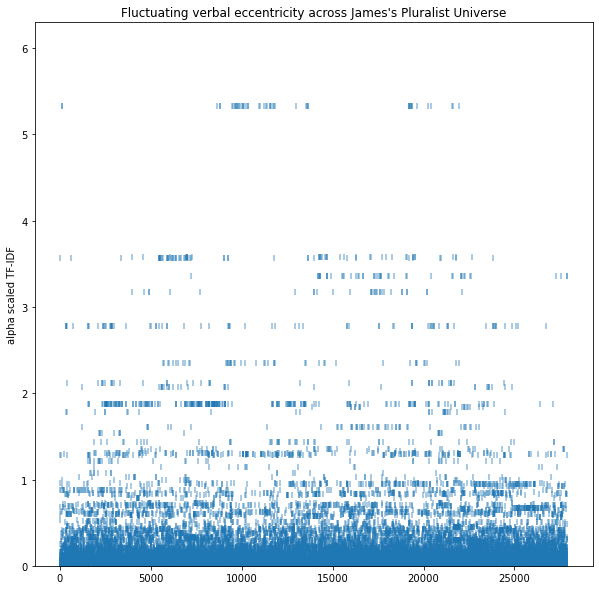

In [1959]:
doc_num=2
philosophy_doc_intensities = [semantic_intensity(word, doc_num) for word in philosophy_docs[ doc_num ]]

plt.rcParams["figure.figsize"] = [10,10]
fig, ax = plt.subplots(nrows=1, ncols=1)
#plt.yscale('log')
#plt.ylim((pow(10,0),pow(10,4)))
#plt.ylim(0, 1300)
plt.ylim(0, 6.3)


ax.scatter(range(len(philosophy_doc_intensities)), philosophy_doc_intensities, alpha=.5, marker='|')
plt.ylabel("alpha scaled TF-IDF")
#ax.set_xticks(range( len(doc1_list)))
#ax.set_xticklabels(doc1_list)

heading_ = "Fluctuating verbal eccentricity across " + book_titles_list[doc_num].replace('\n', ' ')
ax.set_title( heading_ )


plt.savefig(viz_path + heading_ + '.svg')
plt.show()

In [1958]:
list_of_tuplets = list(zip(philosophy_docs[doc_num] , philosophy_doc_intensities))
words_sorted_by_intensity = sorted(list_of_tuplets, key= lambda x: x[1])
temp_df = pd.DataFrame(words_sorted_by_intensity).groupby(by=0).agg('mean').sort_values(by=1, ascending=False).head(50)
temp_df

,1
0,
fechner,5.323694
intellectualism,3.583256
hegel,3.569550
bergson,3.355377
intellectualist,3.173741
empiricism,2.784249
monistic,2.784249
hegels,2.354711
fechners,2.354711


## Whitehead paragraph-by-Paragraph

#### Paragraph-by-Paragraph analysis of verbal semantic eccentricity (idiosyncrasy) in Whitehead

In [1372]:
with open("/Users/joshuamailman/Desktop/Metis_Bootcamp/Metis_Bootcamp_repos/langauge_on_a_holiday/data/Process and Reality_df.pickle", 'rb') as to_read:
    Whitehead_df =  pickle.load(to_read)

In [1373]:
Whitehead_df 

,par_text
317,CHAPTER I SPECULATIVE PHILOSOPHY
318,SECTION I
319,[4] This course of lectures is designed as an...
320,Speculative Philosophy is the endeavour to fr...
321,"[5] Coherence, as here employed, means that t..."
...,...
2566,SECTION VII
2567,Thus the consequent nature of God is composed...
2568,Each actuality in the temporal world has its ...
2569,But the principle of universal relativity is ...


In [1963]:
doc_num=1

In [1964]:
Whitehead_content_df = Whitehead_df[Whitehead_df.loc[:,'par_text'].str.len( ) > 80]

In [1965]:
s = Whitehead_df[Whitehead_df.loc[:,'par_text'].str.contains('The function of being a means')]['par_text'].iloc[0]




In [1966]:
def aggregate_semantic_eccentricity(s, doc_num, exclude_zeros=False):
    sum_ = 0 
    count = 0
    if exclude_zeros == False:
        for w in s.split():
            sum_ += semantic_intensity(w, doc_num)
            count+=1
    else:
        for w in s.split():
            val = semantic_intensity(w, doc_num)
            if val > 0:
                sum_+=val
                count+=1
    try:
        return float(sum_)/count
    except:
        return 0
        

In [1967]:
aggregate_semantic_eccentricity(s, 1, True)

0.2611671389806618

In [1968]:
Whitehead_content_df['alpha_adjust-tfidf'] = Whitehead_content_df['par_text'].apply(aggregate_semantic_eccentricity, args=(1, False))

In [1969]:
Whitehead_content_df.sort_values(by='alpha_adjust-tfidf', ascending = False)

,par_text,alpha_adjust-tfidf
736,This account of presentational immediacy pres...,0.854966
1530,and the other mental. The physical prehension...,0.739933
476,"Prehensions of actual entities— i.e., prehens...",0.730512
477,(xii) That there are two species of prehensio...,0.654969
1798,The prehensions in disjunction are abstractio...,0.650131
...,...,...
528,"3 Cf. ""Artistic Creation and Cosmic Creation,...",0.000000
458,"(viii) Contrasts, or Modes of Synthesis of En...",0.000000
456,"(vi) Propositions, or Matters of Fact in Pote...",0.000000
455,"(v) Eternal Objects, or Pure Potentials for t...",0.000000


In [1971]:
Whitehead_content_df['alpha_adjust-tfidf_exclude_zero'] = Whitehead_content_df['par_text'].apply(aggregate_semantic_eccentricity, args=(1, True))

In [1975]:
Whitehead_content_df.head(25)

,par_text,alpha_adjust-tfidf,alpha_adjust-tfidf_exclude_zero
319,[4] This course of lectures is designed as an...,0.030780,0.092341
320,Speculative Philosophy is the endeavour to fr...,0.057497,0.203292
321,"[5] Coherence, as here employed, means that t...",0.092475,0.329101
322,"The term logical has its ordinary meaning, in...",0.094916,0.239551
323,It will also be noticed that this ideal of sp...,0.044929,0.124641
325,means that the texture of observed experience...,0.041082,0.136393
326,This doctrine of necessity in universality me...,0.084195,0.237278
328,Philosophers can never hope finally to formul...,0.047821,0.121726
329,There is no first principle which is in itsel...,0.050116,0.161485
330,The difficulty has its seat in the empirical ...,0.106068,0.360633


In [1973]:
Whitehead_content_df.shape[0]

1573

### Including words with a zero score (stopwords)

In [2009]:
plot_df = pd.DataFrame({'paragraph': range(Whitehead_content_df.shape[0]), 'alpha_adjusted_tf_idf': Whitehead_content_df['alpha_adjust-tfidf']} )
plot_df

,paragraph,alpha_adjusted_tf_idf
319,0,0.030780
320,1,0.057497
321,2,0.092475
322,3,0.094916
323,4,0.044929
...,...,...
2564,1568,0.085994
2565,1569,0.038019
2567,1570,0.130946
2568,1571,0.135423


In [2010]:
#plot_df = pd.DataFrame({'paragraph': [1, 2, 3], 'alpha_adjusted_tf_idf': [0.1, 2.5, 1.8]})

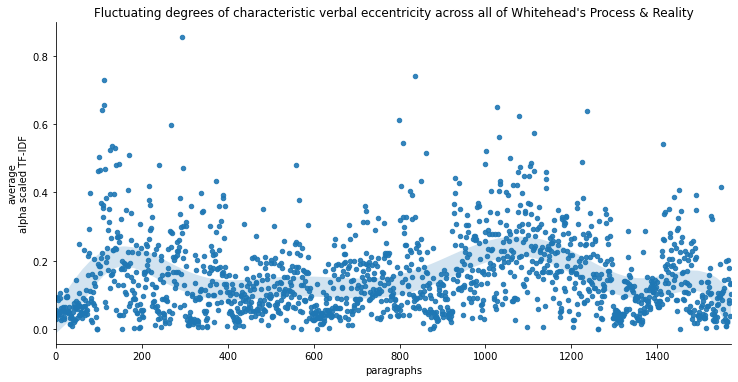

In [2011]:
heading_ = "Fluctuating degrees of characteristic verbal eccentricity across all of Whitehead's Process & Reality"
num_x_points = plot_df.shape[0]
plt.rcParams["figure.figsize"] = [25,6]

#g=sns.lmplot(x='paragraph', y='alpha_adjusted_tf_idf', data=plot_df, 
#         aspect=2,   ci=None, order =40, scatter_kws={'s':20, 'alpha':0.9}, line_kws={'lw':20, 'alpha':0.2})

g=sns.lmplot(x='paragraph', y='alpha_adjusted_tf_idf', data=plot_df, 
         aspect=2,   ci=None, order =10, scatter_kws={'s':20, 'alpha':0.9}, line_kws={'lw':20, 'alpha':0.2})

#g.set(ylim=(0, 6))
#g.set(xlim=(0, num_x_points+.2))
#g.set(xticks =  range(num_x_points) )
#g.set(xticklabels= word_sequence)
#g.set(xlabel= '')
plt.title(heading_)
#plt.ylabel("average alpha scaled TF-IDF")
#g.set_ylabel("average alpha scaled TF-IDF")
g.set_axis_labels( 'paragraphs', 'average\nalpha scaled TF-IDF')
g.savefig(viz_path + heading_ + '.svg')

#g.set(xlim=(0, 5))
plt.show()

In [1977]:
Whitehead_content_df.sort_values(by='alpha_adjust-tfidf', ascending=False).head(20)

,par_text,alpha_adjust-tfidf,alpha_adjust-tfidf_exclude_zero
736,This account of presentational immediacy pres...,0.854966,1.538938
1530,and the other mental. The physical prehension...,0.739933,1.792282
476,"Prehensions of actual entities— i.e., prehens...",0.730512,1.582777
477,(xii) That there are two species of prehensio...,0.654969,1.877578
1798,The prehensions in disjunction are abstractio...,0.650131,1.700342
472,The term objectification refers to the partic...,0.640219,1.408483
2093,The concrescence presupposes its basic region...,0.639908,1.679758
1869,[377] A hybrid physical feeling originates fo...,0.624912,1.507141
1483,[280] A living occasion is characterized by a...,0.612389,1.562647
700,In causal objectification what is felt subjec...,0.597434,1.216995


In [1483]:
Whitehead_content_df.columns

Index(['par_text', 'alpha_adjust-tfidf', 'alpha_adjust-tfidf_exclude_zero'], dtype='object')

### Excluding words with a zero score (stopwords)

In [2012]:
plot_df = pd.DataFrame({'paragraph': range(Whitehead_content_df.shape[0]), 'alpha_adjusted_tf_idf_exclude_zero': Whitehead_content_df['alpha_adjust-tfidf_exclude_zero']} )
plot_df

,paragraph,alpha_adjusted_tf_idf_exclude_zero
319,0,0.092341
320,1,0.203292
321,2,0.329101
322,3,0.239551
323,4,0.124641
...,...,...
2564,1568,0.261167
2565,1569,0.180588
2567,1570,0.461430
2568,1571,0.382371


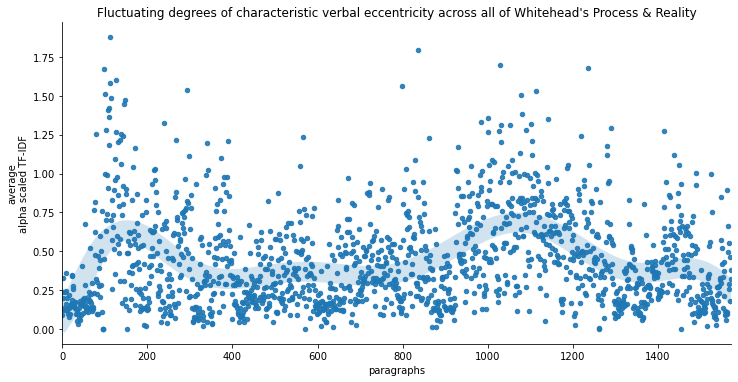

In [2015]:
heading_ = "Fluctuating degrees of characteristic verbal eccentricity across all of Whitehead's Process & Reality"
num_x_points = plot_df.shape[0]
plt.rcParams["figure.figsize"] = [25,6]

#g=sns.lmplot(x='paragraph', y='alpha_adjusted_tf_idf', data=plot_df, 
#         aspect=2,   ci=None, order =40, scatter_kws={'s':20, 'alpha':0.9}, line_kws={'lw':20, 'alpha':0.2})

g=sns.lmplot(x='paragraph', y='alpha_adjusted_tf_idf_exclude_zero', data=plot_df, 
         aspect=2,   ci=None, order =10, scatter_kws={'s':20, 'alpha':0.9}, line_kws={'lw':20, 'alpha':0.2})

#g.set(ylim=(0, 6))
#g.set(xlim=(0, num_x_points+.2))
#g.set(xticks =  range(num_x_points) )
#g.set(xticklabels= word_sequence)
#g.set(xlabel= '')
plt.title(heading_)
plt.ylabel("average alpha scaled TF-IDF")
g.savefig(viz_path + heading_ + '.svg')
g.set_axis_labels( 'paragraphs', 'average\nalpha scaled TF-IDF')
#g.set(xlim=(0, 5))

In [1983]:
Whitehead_content_df.columns

Index(['par_text', 'alpha_adjust-tfidf', 'alpha_adjust-tfidf_exclude_zero'], dtype='object')

In [1984]:
Whitehead_content_df.sort_values(by='alpha_adjust-tfidf_exclude_zero', ascending=False).head(20)

,par_text,alpha_adjust-tfidf,alpha_adjust-tfidf_exclude_zero
477,(xii) That there are two species of prehensio...,0.654969,1.877578
1530,and the other mental. The physical prehension...,0.739933,1.792282
1798,The prehensions in disjunction are abstractio...,0.650131,1.700342
2093,The concrescence presupposes its basic region...,0.639908,1.679758
462,"(i) That the actual world is a process, and t...",0.461624,1.673386
494,(xxiv) The functioning of one actual entity i...,0.523380,1.602851
476,"Prehensions of actual entities— i.e., prehens...",0.730512,1.582777
1483,[280] A living occasion is characterized by a...,0.612389,1.562647
736,This account of presentational immediacy pres...,0.854966,1.538938
1916,physical feelings. If in the conceptual feeli...,0.574616,1.532309


In [ ]:
Whitehead_content_df